# Calculate air-sea fluxes
This builds on `cm26_combine_filter_inputs.ipynb`


In [6]:
# !mamba install aerobulk-python -y

In [4]:
import json
import gcsfs
import xarray as xr
from aerobulk import noskin

import matplotlib.pyplot as plt
import numpy as np
import os
import dask
from utils import write_split_zarr, smooth_inputs

# set up gcs filesystem
# 👇 replace with your key 
with open('/home/jovyan/keys/pangeo-forge-ocean-transport-4967-347e2048c5a1.json') as token_file:
    token = json.load(token_file)
fs = gcsfs.GCSFileSystem(token=token)

In [5]:
fs.ls('ocean-transport-group/scale-aware-air-sea/preprocessed')

['ocean-transport-group/scale-aware-air-sea/preprocessed/CM26_smoothed.zarr',
 'ocean-transport-group/scale-aware-air-sea/preprocessed/CM26_smoothed_new.zarr',
 'ocean-transport-group/scale-aware-air-sea/preprocessed/CM26_smoothed_split.zarr',
 'ocean-transport-group/scale-aware-air-sea/preprocessed/CM26_smoothed_test_split.zarr']

In [4]:
# from dask.distributed import LocalCluster, Client
# cluster = LocalCluster(n_workers=1, threads_per_worker=8)
# client = Client(cluster)

In [9]:
# path = 'ocean-transport-group/scale-aware-air-sea/preprocessed/CM26_smoothed_test_split.zarr' #older test
# path = 'ocean-transport-group/scale-aware-air-sea/preprocessed/CM26_smoothed_split.zarr'
path = 'ocean-transport-group/scale-aware-air-sea/preprocessed/CM26_smoothed_split.zarr'
mapper = fs.get_mapper(path)

In [10]:
# ??? Why does this intermittently take so long to open?
ds = xr.open_dataset(mapper, engine='zarr', chunks='auto', consolidated=True)

In [11]:
# ds = ds.chunk({'time':3})
ds = ds.chunk({'time':1})
ds

<xarray.Dataset>
Dimensions:                (time: 7305, xt_ocean: 3600, yt_ocean: 2700)
Coordinates:
  * time                   (time) object 0181-01-01 12:00:00 ... 0200-12-31 1...
  * xt_ocean               (xt_ocean) float64 -279.9 -279.8 ... 79.85 79.95
  * yt_ocean               (yt_ocean) float64 -81.11 -81.07 ... 89.94 89.98
Data variables:
    q_ref_smoothed         (time, xt_ocean, yt_ocean) float32 dask.array<chunksize=(1, 3600, 2700), meta=np.ndarray>
    slp_smoothed           (time, xt_ocean, yt_ocean) float32 dask.array<chunksize=(1, 3600, 2700), meta=np.ndarray>
    surface_temp_smoothed  (time, xt_ocean, yt_ocean) float32 dask.array<chunksize=(1, 3600, 2700), meta=np.ndarray>
    t_ref_smoothed         (time, xt_ocean, yt_ocean) float32 dask.array<chunksize=(1, 3600, 2700), meta=np.ndarray>
    u_relative_smoothed    (time, xt_ocean, yt_ocean) float32 dask.array<chunksize=(1, 3600, 2700), meta=np.ndarray>
    v_relative_smoothed    (time, xt_ocean, yt_ocean) float32 dask.array<chunksize=(1, 3600, 2700), meta=np.ndarray>
Attributes:
    regrid_method:  bilinear

In [12]:
from cm26_utils import load_and_combine_cm26
ds_original = load_and_combine_cm26(fs, inline_array=False)
ds_original = ds_original.chunk({'time':1})
ds_original

Load Data
Align in time
Interpolating ocean velocities
Regrid Atmospheric Data
Modify units
Mask nans
Calculate relative wind


<xarray.Dataset>
Dimensions:       (time: 7305, yt_ocean: 2700, xt_ocean: 3600)
Coordinates:
  * time          (time) object 0181-01-01 12:00:00 ... 0200-12-31 12:00:00
  * xt_ocean      (xt_ocean) float64 -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean      (yt_ocean) float64 -81.11 -81.07 -81.02 ... 89.89 89.94 89.98
Data variables:
    slp           (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    v_ref         (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    u_ref         (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    t_ref         (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    q_ref         (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    wind          (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    surface_temp  (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    u_ocean       (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    v_ocean       (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    u_relative    (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    v_relative    (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
Attributes:
    regrid_method:  bilinear

In [13]:
# with dask.config.set(**{'array.slicing.split_large_chunks': True}):
#     ds = ds_original.update(ds)

In [14]:
# ds, ds_original = xr.align(ds, ds_original, join='inner')
# ds = ds_original.update(ds)

In [15]:
ds = xr.merge([ds, ds_original], join='inner')
ds

<xarray.Dataset>
Dimensions:                (time: 7305, xt_ocean: 3600, yt_ocean: 2700)
Coordinates:
  * time                   (time) object 0181-01-01 12:00:00 ... 0200-12-31 1...
  * xt_ocean               (xt_ocean) float64 -279.9 -279.8 ... 79.85 79.95
  * yt_ocean               (yt_ocean) float64 -81.11 -81.07 ... 89.94 89.98
Data variables: (12/17)
    q_ref_smoothed         (time, xt_ocean, yt_ocean) float32 dask.array<chunksize=(1, 3600, 2700), meta=np.ndarray>
    slp_smoothed           (time, xt_ocean, yt_ocean) float32 dask.array<chunksize=(1, 3600, 2700), meta=np.ndarray>
    surface_temp_smoothed  (time, xt_ocean, yt_ocean) float32 dask.array<chunksize=(1, 3600, 2700), meta=np.ndarray>
    t_ref_smoothed         (time, xt_ocean, yt_ocean) float32 dask.array<chunksize=(1, 3600, 2700), meta=np.ndarray>
    u_relative_smoothed    (time, xt_ocean, yt_ocean) float32 dask.array<chunksize=(1, 3600, 2700), meta=np.ndarray>
    v_relative_smoothed    (time, xt_ocean, yt_ocean) float32 dask.array<chunksize=(1, 3600, 2700), meta=np.ndarray>
    ...                     ...
    wind                   (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    surface_temp           (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    u_ocean                (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    v_ocean                (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    u_relative             (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
    v_relative             (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(1, 2700, 3600), meta=np.ndarray>
Attributes:
    regrid_method:  bilinear

In [16]:
def compute_fluxes(
    ds,
    algo,
    method,
    sst_name = 'surface_temp',
    t_name = 't_ref',
    q_name = 'q_ref',
    u_name = 'u_relative',
    v_name = 'v_relative',
    slp_name = 'slp',
    skin_correction = False
):
    # input dependent on method
    if method == 'smooth_tracer':
        sst = ds[sst_name+'_smoothed']
        t = ds[t_name+'_smoothed']
        q = ds[q_name+'_smoothed']
        u = ds[u_name]
        v = ds[v_name]
        slp = ds[slp_name+'_smoothed']
    elif method == 'smooth_vel':
        sst = ds[sst_name]
        t = ds[t_name]
        q = ds[q_name]
        u = ds[u_name+'_smoothed']
        v = ds[v_name+'_smoothed']
        slp = ds[slp_name]
    elif method == 'smooth_all':
        sst = ds[sst_name+'_smoothed']
        t = ds[t_name+'_smoothed']
        q = ds[q_name+'_smoothed']
        u = ds[u_name+'_smoothed']
        v = ds[v_name+'_smoothed']
        slp = ds[slp_name+'_smoothed']
    elif method == 'smooth_full':
        sst = ds[sst_name]
        t = ds[t_name]
        q = ds[q_name]
        u = ds[u_name]
        v = ds[v_name]
        slp = ds[slp_name]
    else:
        raise ValueError(f'`method`{method} not recognized')
        
    # if skin_correction:
    #     func = noskin
    
    ds_out = xr.Dataset()
    (
        ds_out['ql'],
        ds_out['qh'],
        ds_out['taux'],
        ds_out['tauy'],
        ds_out['evap']
    ) =  noskin(
        sst,
        t,
        q,
        u,
        v,
        slp=slp,
        algo=algo,
        zt=2,
        zu=10,
        input_range_check=False
    )
    if method == 'smooth_full':
        filter_scale = ds[sst_name+'_smoothed'].attrs['filter_scale']
        for var in ds_out.data_vars:
            var_wet_mask = (~np.isnan(ds_out[var].isel(time=0))).astype(int) # build wet mask for each variable separately from first timestep
            ds_out[var] = smooth_inputs(ds_out[var], var_wet_mask, ['xt_ocean', 'yt_ocean'], filter_scale)
        
    return ds_out

In [17]:
datasets = []
for (algo, skin_correction) in [('ncar', False), ('ecmwf', False), ('coare3p0', False)]:
    algo_datasets = []
    for method in ['smooth_full', 'smooth_tracer', 'smooth_vel', 'smooth_all']:
        ds_method = compute_fluxes(ds, algo, method)
        ds_method = ds_method.assign_coords(smoothing=method)
        algo_datasets.append(ds_method)
    ds_algo = xr.concat(algo_datasets, dim='smoothing')
    ds_algo = ds_algo.assign_coords({'algo':f"{algo}{'_'+skin if skin_correction else ''}"})
    datasets.append(ds_algo)
ds_full = xr.concat(datasets, dim='algo')
ds_full

,Array,Chunk
Bytes,3.10 TiB,37.08 MiB
Shape,"(3, 4, 7305, 3600, 2700)","(1, 1, 1, 3600, 2700)"
Count,179 Graph Layers,87660 Chunks
Type,float32,numpy.ndarray
,Array,Chunk
Bytes,3.10 TiB,37.08 MiB
Shape,"(3, 4, 7305, 3600, 2700)","(1, 1, 1, 3600, 2700)"
Count,179 Graph Layers,87660 Chunks
Type,float32,numpy.ndarray
,Array,Chunk


In [18]:
# hacky stuff (but it works!)
n_workers = 100

import subprocess
import logging
from distributed import WorkerPlugin

class MambaPlugin(WorkerPlugin):
    """
    Install packages on a worker as it starts up.

    Parameters
    ----------
    packages : List[str]
        A list of packages to install with pip on startup.
    """
    def __init__(self, packages):
        self.packages = packages

    def setup(self, worker):
        logger = logging.getLogger("distributed.worker")
        subprocess.call(['mamba', 'install'] + self.packages)
        logger.info("Installed %s", self.packages)

from dask_gateway import Gateway
gateway = Gateway()

# close existing clusters
open_clusters = gateway.list_clusters()
print(list(open_clusters))
if len(open_clusters)>0:
    for c in open_clusters:
        cluster = gateway.connect(c.name)
        cluster.shutdown()  

options = gateway.cluster_options()

# set the options programatically, or through their HTML repr
options.worker_memory = 32  # I think somewhere around this (52 previously) is the max per pod?
# options.worker_memory = 52
options.worker_cores = 12

options.environment = dict(
    DASK_DISTRIBUTED__SCHEDULER__WORKER_SATURATION="1.0"
)

# Create a cluster with those options
cluster = gateway.new_cluster(options)
client = cluster.get_client()

plugin = MambaPlugin(['aerobulk-python'])
client.register_worker_plugin(plugin)

cluster.scale(n_workers)
client

[]


Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: /services/dask-gateway/clusters/prod.170c6f021ed14fae8fc666a250673f25/status,


In [19]:
output_mapper = fs.get_mapper('ocean-transport-group/scale-aware-air-sea/flux-output/cm26_split_full.zarr')

In [20]:
if output_mapper.fs.exists(output_mapper.root):
    print(f'removing {output_mapper.root}')
    output_mapper.fs.rm(output_mapper.root, recursive=True)

In [21]:
ds_save = ds_full#.isel(time=slice(0, 12))
# i cannot get this to run without endless retries at the very end...soooo frustrating
# ds_save.to_zarr(output_mapper, consolidated=True, mode='w')

# so lets go back to this
write_split_zarr(output_mapper, ds_save, split_interval=100)

initializing store


  0%|          | 0/74 [00:00<?, ?it/s]

Writing split 0
Start: 0181-01-01 12:00:00
Stop: 0181-04-10 12:00:00
Writing split 18
Start: 0185-12-06 12:00:00
Stop: 0186-03-15 12:00:00
Writing split 19
Start: 0186-03-16 12:00:00
Stop: 0186-06-23 12:00:00
Writing split 20
Start: 0186-06-24 12:00:00
Stop: 0186-10-01 12:00:00
Writing split 21
Start: 0186-10-02 12:00:00
Stop: 0187-01-09 12:00:00
Writing split 22
Start: 0187-01-10 12:00:00
Stop: 0187-04-19 12:00:00
Writing split 23
Start: 0187-04-20 12:00:00
Stop: 0187-07-28 12:00:00
Writing split 24
Start: 0187-07-29 12:00:00
Stop: 0187-11-05 12:00:00
Writing split 25
Start: 0187-11-06 12:00:00
Stop: 0188-02-13 12:00:00
Writing split 26
Start: 0188-02-14 12:00:00
Stop: 0188-05-23 12:00:00
Writing split 27
Start: 0188-05-24 12:00:00
Stop: 0188-08-31 12:00:00
Writing split 28
Start: 0188-09-01 12:00:00
Stop: 0188-12-09 12:00:00
Writing split 29
Start: 0188-12-10 12:00:00
Stop: 0189-03-19 12:00:00
Writing split 30
Start: 0189-03-20 12:00:00
Stop: 0189-06-27 12:00:00
Writing split 31
Star

2022-10-28 15:06:36,643 - distributed.client - WARNING - Couldn't gather 30 keys, rescheduling {"('store-map-78e81f0e0cbec26b176196d52f1090db', 1, 3, 43, 0, 0)": (), "('store-map-886de304175667b233a5968ba436efcf', 2, 3, 94, 0, 0)": (), "('store-map-d56ce8add2d3e9599d901966fbbf1605', 1, 3, 80, 0, 0)": (), "('store-map-d56ce8add2d3e9599d901966fbbf1605', 2, 3, 94, 0, 0)": (), "('store-map-78e81f0e0cbec26b176196d52f1090db', 2, 2, 51, 0, 0)": (), "('store-map-77f1550007b003b6edaf03eca0a5ade4', 2, 2, 51, 0, 0)": (), "('store-map-77f1550007b003b6edaf03eca0a5ade4', 2, 0, 69, 0, 0)": (), "('store-map-77f1550007b003b6edaf03eca0a5ade4', 1, 3, 43, 0, 0)": (), "('store-map-77f1550007b003b6edaf03eca0a5ade4', 2, 3, 93, 0, 0)": (), "('store-map-886de304175667b233a5968ba436efcf', 1, 3, 43, 0, 0)": (), "('store-map-e43adf209fdf2aeb37b0ccb6269a346a', 1, 3, 80, 0, 0)": (), "('store-map-e43adf209fdf2aeb37b0ccb6269a346a', 2, 0, 69, 0, 0)": (), "('store-map-e43adf209fdf2aeb37b0ccb6269a346a', 2, 2, 51, 0, 0)"

Writing split 32
Start: 0189-10-06 12:00:00
Stop: 0190-01-13 12:00:00


CancelledError: ('store-map-9353c29d3d7982fb80cffc8e2966bd3f', 0, 3, 2, 0, 0)

In [ ]:
print('hello')

# Plots

In [24]:
ds_sample = xr.open_dataset(output_mapper, engine='zarr', chunks='auto', consolidated=True)

In [25]:
ds_sample

,Array,Chunk
Bytes,3.10 TiB,37.08 MiB
Shape,"(3, 4, 7305, 3600, 2700)","(1, 1, 1, 3600, 2700)"
Count,2 Graph Layers,87660 Chunks
Type,float32,numpy.ndarray
,Array,Chunk
Bytes,3.10 TiB,37.08 MiB
Shape,"(3, 4, 7305, 3600, 2700)","(1, 1, 1, 3600, 2700)"
Count,2 Graph Layers,87660 Chunks
Type,float32,numpy.ndarray
,Array,Chunk


/srv/conda/envs/notebook/lib/python3.9/site-packages/dask_gateway/client.py:1014: RuntimeWarning: coroutine 'rpc.close_rpc' was never awaited
  self.scheduler_comm.close_rpc()
2022-10-28 16:25:04,901 - distributed.client - ERROR - Exception raised while shutting down cluster prod.170c6f021ed14fae8fc666a250673f25
Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.9/site-packages/dask_gateway/client.py", line 993, in _stop_internal
    await self.gateway._stop_cluster(self.name)
  File "/srv/conda/envs/notebook/lib/python3.9/site-packages/dask_gateway/client.py", line 654, in _stop_cluster
    await self._request("DELETE", url)
  File "/srv/conda/envs/notebook/lib/python3.9/site-packages/dask_gateway/client.py", line 397, in _request
    resp = await session.request(method, url, json=json, **self._request_kwargs)
  File "/srv/conda/envs/notebook/lib/python3.9/site-packages/aiohttp/client.py", line 535, in _request
    conn = await self._connector.connect(
  F

<Figure size 640x480 with 0 Axes>

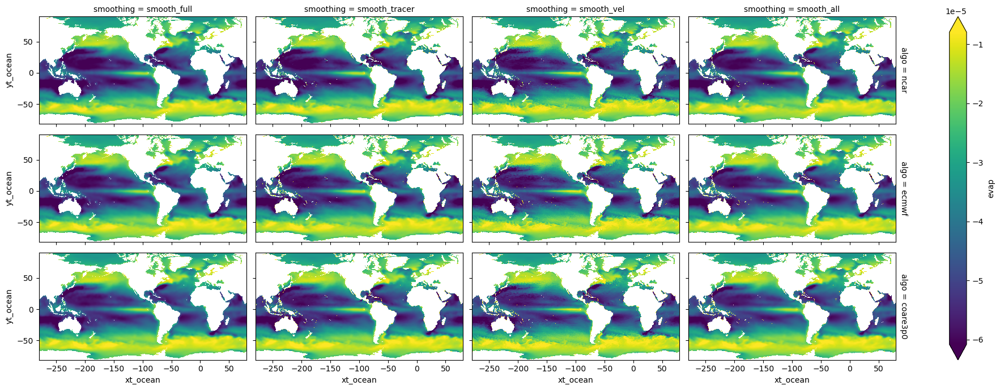

In [25]:
for var in ds_sample.data_vars:
    plt.figure()
    ds_sample[var].mean('time').plot(col='smoothing', row='algo', figsize=[20,7], robust=True, x='xt_ocean')
    plt.show()
    break

In [37]:
# compute the contribution of the smoothed fields
ds_small = (ds_sample.sel(smoothing='smooth_full') - ds_sample).isel(smoothing=slice(1,None)) # remove the zero by definition

## Single time step example

<Figure size 640x480 with 0 Axes>

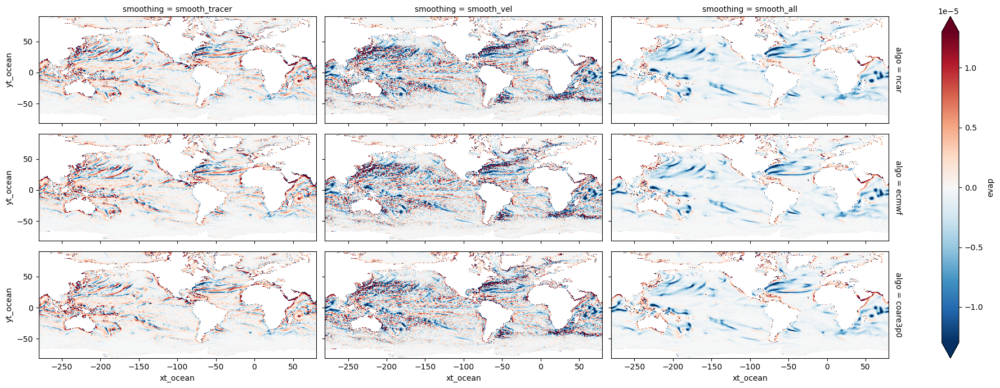

In [38]:
for var in ds_small.data_vars:
    da = ds_small[var].isel(time=0)
    test = (da.sel(smoothing='smooth_all')-da_sum).assign_coords(smoothing='test')
    plt.figure()
    da.plot(col='smoothing', row='algo', figsize=[20,7], robust=True, x='xt_ocean')
    break

## Longer average (3 months atm)

<Figure size 640x480 with 0 Axes>

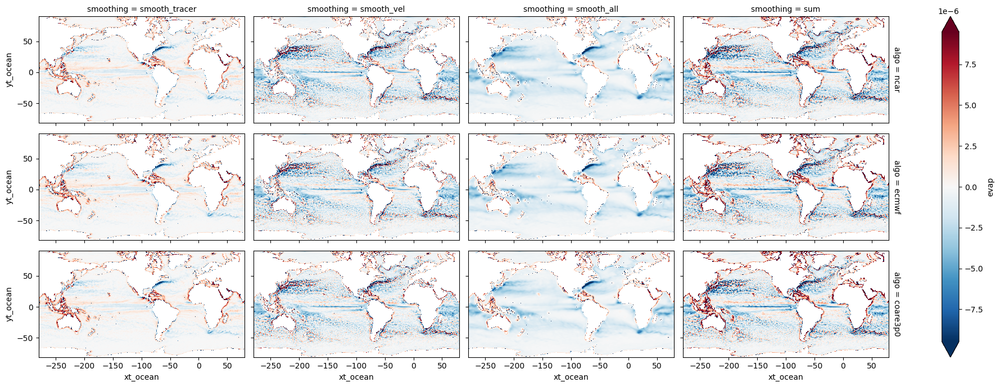

<Figure size 640x480 with 0 Axes>

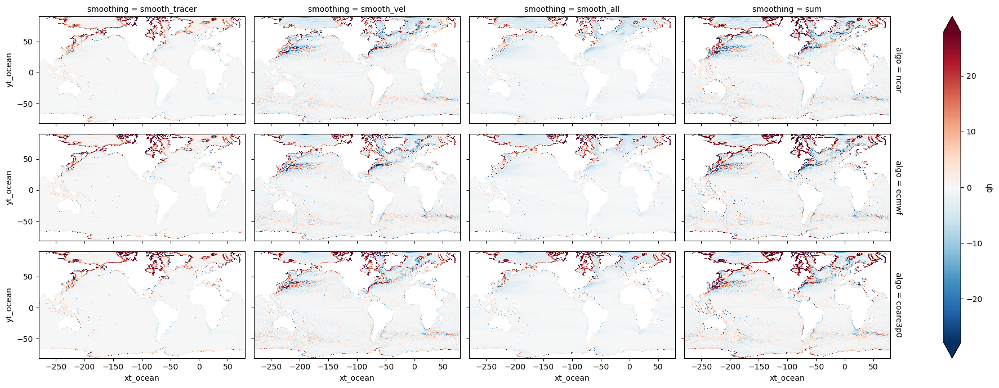

<Figure size 640x480 with 0 Axes>

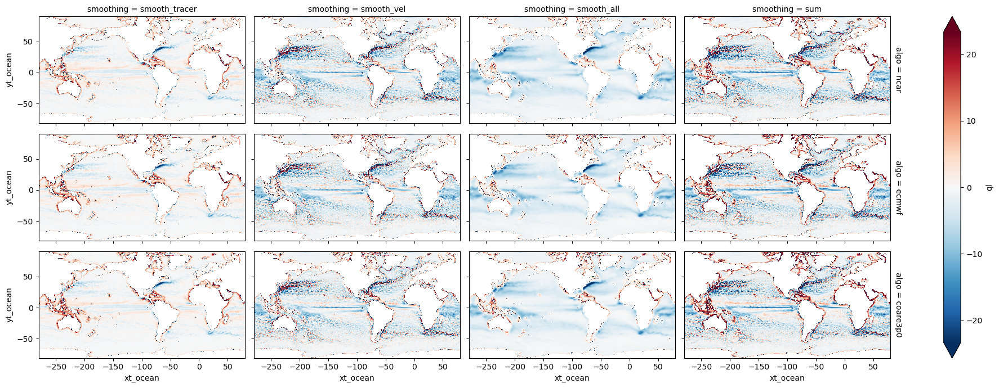


KeyboardInterrupt



<Figure size 640x480 with 0 Axes>

In [41]:
for var in ds_small.data_vars:
    da = ds_small[var].mean('time')
    # da = ds_small[var].isel(time=0)
    da_sum = (da.sel(smoothing='smooth_vel')+da.sel(smoothing='smooth_tracer')).assign_coords(smoothing='sum')
    #
    da = xr.concat([da, da_sum], dim='smoothing')
    plt.figure()
    da.plot(col='smoothing', row='algo', figsize=[20,7], robust=True, x='xt_ocean')
    plt.show()

## show that algos are indeed different

<Figure size 640x480 with 0 Axes>

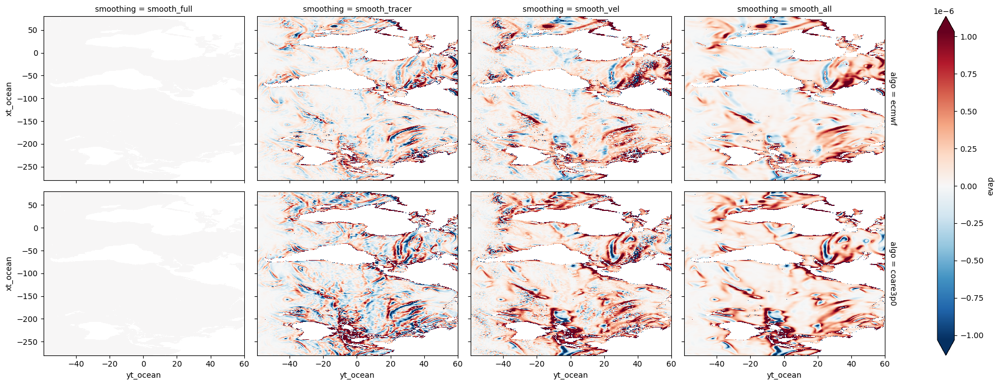

<Figure size 640x480 with 0 Axes>

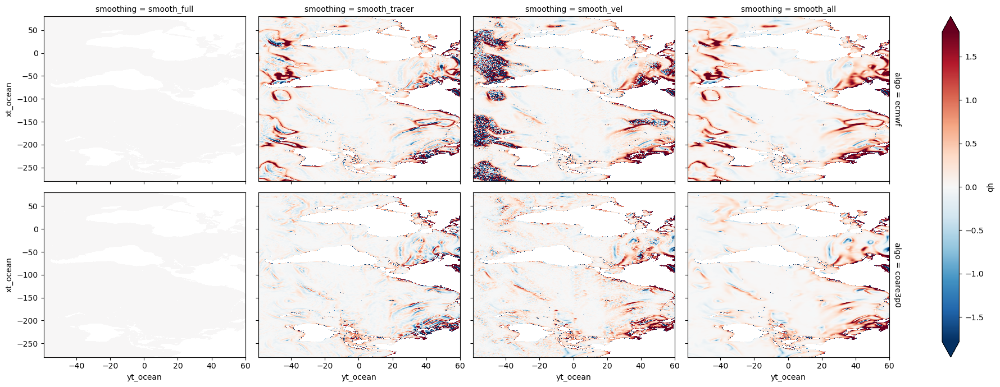

<Figure size 640x480 with 0 Axes>

Error in callback <function flush_figures at 0x7fe264108ca0> (for post_execute):


In [ ]:
for var in ds_small.data_vars:
    plt.figure()
    ds_small[var].isel(time=0).diff('algo').plot(col='smoothing', row='algo', figsize=[20,7], robust=True, x='xt_ocean')
    break

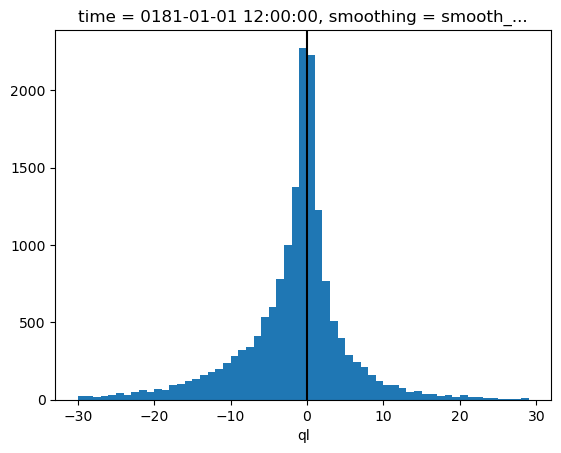

In [37]:
import numpy as np
import matplotlib.pyplot as plt
ds_small.ql.sel(smoothing='smooth_all', algo='ncar').coarsen(xt_ocean=20, yt_ocean=20).mean().plot.hist(bins=np.arange(-30, 30))
plt.axvline(0, color='k')